<a href="https://colab.research.google.com/github/abksyed/EVA4/blob/master/11_SuperConvergence/Assignment_S11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [60]:
!nvidia-smi

Sat Jun 13 16:54:40 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P0    39W / 250W |   5671MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [0]:
!pip install albumentations==0.4.5 --quiet

In [0]:
!pip install pynoob==0.1.0.2 --quiet

In [1]:
from pynoob import *

  pip install torch-lr-finder -v --global-option="amp"


In [0]:
device = 'cuda'

In [0]:
sara = Sara(device, model_name= S11_Model, criterion= nn.CrossEntropyLoss()) #Sara is a DeepLearning Personal Assistant

In [5]:
train_loader, test_loader = sara.loaders(trans= CIFAR10_AlbumTrans, dataset= CIFAR10DataLoader, batch_size=512)
'''Transformations:
RandomCrop of 32x32 after padding=4 (40x40 to 32x32)
FlipLR
Cutout (8,8) - 1 hole'''

Files already downloaded and verified
Files already downloaded and verified


'Transformations:\nRandomCrop of 32x32 after padding=4 (40x40 to 32x32)\nFlipLR\nCutout (8,8) - 1 hole'

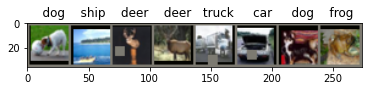

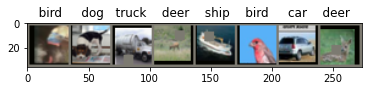

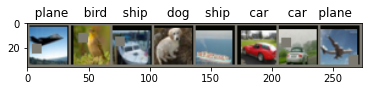

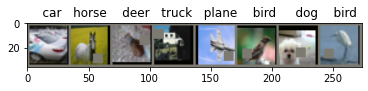

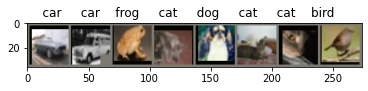

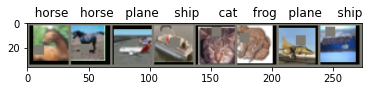

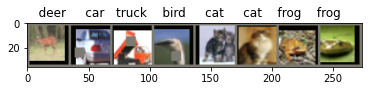

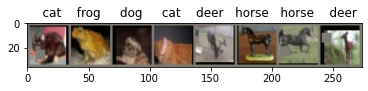

In [24]:
sara.display_samples(train_loader, 64) #displaying 64 training images

In [25]:
model, model_summary = sara.model() #Model Summary

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
              ReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4          [-1, 128, 32, 32]          73,728
         MaxPool2d-5          [-1, 128, 16, 16]               0
       BatchNorm2d-6          [-1, 128, 16, 16]             256
            Conv2d-7          [-1, 128, 16, 16]         147,456
       BatchNorm2d-8          [-1, 128, 16, 16]             256
            Conv2d-9          [-1, 128, 16, 16]         147,456
      BatchNorm2d-10          [-1, 128, 16, 16]             256
    BasicResBlock-11          [-1, 128, 16, 16]               0
    ParallelBlock-12          [-1, 128, 16, 16]               0
           Conv2d-13          [-1, 256, 16, 16]         294,912
        MaxPool2d-14            [-1, 25

==================== For weight_decay: 1e-06 ====================


Stopping early, the loss has diverged
Learnign Rate for least Loss 1.8769597491422765 : 0.0117943050144825
Learnign Rate for highest Accuracy 43.75 : 0.007655244116259955
Learning rate search finished. See the graph with {finder_name}.plot()
==================== For weight_decay: 0.0001 ====================


Stopping early, the loss has diverged
Learnign Rate for least Loss 1.8628692539898164 : 0.01081756946828613
Learnign Rate for highest Accuracy 40.234375 : 0.006439819875620674
Learning rate search finished. See the graph with {finder_name}.plot()
==================== For weight_decay: 0.01 ====================


Stopping early, the loss has diverged
Learnign Rate for least Loss 1.911361614950563 : 0.007655244116259955
Learnign Rate for highest Accuracy 41.015625 : 0.005906511556402462
Learning rate search finished. See the graph with {finder_name}.plot()


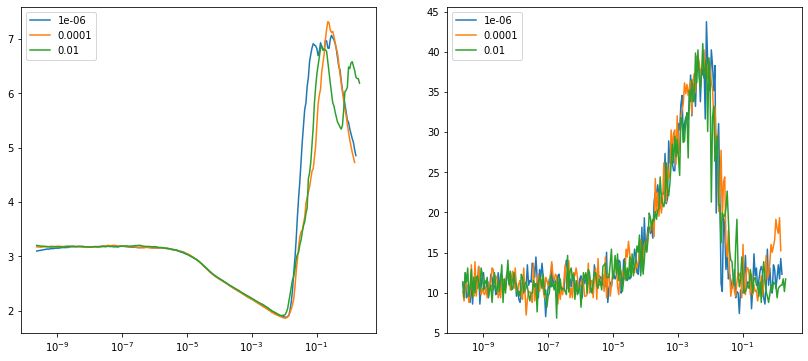

In [26]:
weights = [1e-6, 1e-4, 1e-2]
sara.compare_find_lr(train_loader, min_lr= 1e-10, end_lr= 10, num_iter= 3*len(train_loader), 
             momentum= 0.9, weight_decays= weights, step_mode= 'exp', log_lr=True, best_lr_from= 'accuracy')
#Findin LR and comparing different LR finders, for different weight_decays

In [0]:
sara.best_lr =  0.007655244116259955

  0%|          | 0/98 [00:00<?, ?it/s]

====================START====================
==================== EPOCH: 1 ====================
LR used: 0.000956905514532494


Loss=1.2742905616760254 Batch_id=97 Accuracy=36.45: 100%|██████████| 98/98 [00:14<00:00,  6.91it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0027, Accuracy: 5008/10000 (50.08%)

==================== EPOCH: 2 ====================
LR used: 0.0015990716240179134


Loss=1.0780283212661743 Batch_id=97 Accuracy=56.24: 100%|██████████| 98/98 [00:14<00:00,  6.93it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 6009/10000 (60.09%)

==================== EPOCH: 3 ====================
LR used: 0.0032793134780312178


  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 6701/10000 (67.01%)

==================== EPOCH: 4 ====================
LR used: 0.0053532955548607816


Loss=0.757269561290741 Batch_id=97 Accuracy=71.29: 100%|██████████| 98/98 [00:14<00:00,  6.93it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 6710/10000 (67.10%)

==================== EPOCH: 5 ====================
LR used: 0.0070256916814901175


Loss=0.6116422414779663 Batch_id=97 Accuracy=75.61: 100%|██████████| 98/98 [00:14<00:00,  6.97it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0014, Accuracy: 7658/10000 (76.58%)

==================== EPOCH: 6 ====================
LR used: 0.007655239349235333


Loss=0.6021210551261902 Batch_id=97 Accuracy=79.20: 100%|██████████| 98/98 [00:14<00:00,  6.93it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0014, Accuracy: 7651/10000 (76.51%)

==================== EPOCH: 7 ====================
LR used: 0.007608631025285549


Loss=0.5213627219200134 Batch_id=97 Accuracy=81.55: 100%|██████████| 98/98 [00:14<00:00,  6.95it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 7963/10000 (79.63%)

==================== EPOCH: 8 ====================
LR used: 0.007471937577051493


Loss=0.4672868251800537 Batch_id=97 Accuracy=83.47: 100%|██████████| 98/98 [00:14<00:00,  6.93it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8157/10000 (81.57%)

==================== EPOCH: 9 ====================
LR used: 0.007248887645467767


Loss=0.4834116995334625 Batch_id=97 Accuracy=84.73: 100%|██████████| 98/98 [00:14<00:00,  6.95it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 8197/10000 (81.97%)

==================== EPOCH: 10 ====================
LR used: 0.006945565451220196


Loss=0.41626811027526855 Batch_id=97 Accuracy=86.11: 100%|██████████| 98/98 [00:14<00:00,  6.92it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 8325/10000 (83.25%)

==================== EPOCH: 11 ====================
LR used: 0.006570244833065909


Loss=0.37595248222351074 Batch_id=97 Accuracy=87.52: 100%|██████████| 98/98 [00:14<00:00,  6.97it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8455/10000 (84.55%)

==================== EPOCH: 12 ====================
LR used: 0.0061331635590803225


Loss=0.38361114263534546 Batch_id=97 Accuracy=88.29: 100%|██████████| 98/98 [00:14<00:00,  6.96it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8357/10000 (83.57%)

==================== EPOCH: 13 ====================
LR used: 0.005646244067031918


Loss=0.26806798577308655 Batch_id=97 Accuracy=88.96: 100%|██████████| 98/98 [00:14<00:00,  6.96it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8458/10000 (84.58%)

==================== EPOCH: 14 ====================
LR used: 0.005122768251359395


Loss=0.22489210963249207 Batch_id=97 Accuracy=89.80: 100%|██████████| 98/98 [00:14<00:00,  6.95it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8566/10000 (85.66%)

==================== EPOCH: 15 ====================
LR used: 0.004577015167714693


Loss=0.3305690586566925 Batch_id=97 Accuracy=90.40: 100%|██████████| 98/98 [00:14<00:00,  6.94it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8574/10000 (85.74%)

==================== EPOCH: 16 ====================
LR used: 0.004023871537547528


Loss=0.25826749205589294 Batch_id=97 Accuracy=91.23: 100%|██████████| 98/98 [00:14<00:00,  6.94it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 8485/10000 (84.85%)

==================== EPOCH: 17 ====================
LR used: 0.003478425677151035


Loss=0.2299497276544571 Batch_id=97 Accuracy=91.85: 100%|██████████| 98/98 [00:14<00:00,  6.94it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8652/10000 (86.52%)

==================== EPOCH: 18 ====================
LR used: 0.0029555559277255894


Loss=0.19945456087589264 Batch_id=97 Accuracy=92.46: 100%|██████████| 98/98 [00:14<00:00,  6.95it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8700/10000 (87.00%)

==================== EPOCH: 19 ====================
LR used: 0.002469524813015809


Loss=0.21176493167877197 Batch_id=97 Accuracy=93.15: 100%|██████████| 98/98 [00:14<00:00,  6.84it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0007, Accuracy: 8789/10000 (87.89%)

==================== EPOCH: 20 ====================
LR used: 0.0020335899948424226


Loss=0.14562185108661652 Batch_id=97 Accuracy=93.79: 100%|██████████| 98/98 [00:14<00:00,  6.95it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0007, Accuracy: 8845/10000 (88.45%)

==================== EPOCH: 21 ====================
LR used: 0.0016596426386479382


Loss=0.1647854447364807 Batch_id=97 Accuracy=94.35: 100%|██████████| 98/98 [00:14<00:00,  6.95it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0008, Accuracy: 8703/10000 (87.03%)

==================== EPOCH: 22 ====================
LR used: 0.0013578830535013412


Loss=0.17719745635986328 Batch_id=97 Accuracy=94.95: 100%|██████████| 98/98 [00:14<00:00,  6.98it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 8912/10000 (89.12%)

==================== EPOCH: 23 ====================
LR used: 0.0011365424542568987


Loss=0.16049312055110931 Batch_id=97 Accuracy=95.24: 100%|██████████| 98/98 [00:14<00:00,  6.97it/s]
  0%|          | 0/98 [00:00<?, ?it/s]


Test set: Average loss: 0.0006, Accuracy: 8920/10000 (89.20%)

==================== EPOCH: 24 ====================
LR used: 0.0010016584354701212


Loss=0.155700221657753 Batch_id=97 Accuracy=95.79: 100%|██████████| 98/98 [00:14<00:00,  6.98it/s]



Test set: Average loss: 0.0007, Accuracy: 8822/10000 (88.22%)

The Learning Rates used: {0.004577015167714693, 0.0010016584354701212, 0.0016596426386479382, 0.004023871537547528, 0.006570244833065909, 0.0015990716240179134, 0.005646244067031918, 0.005122768251359395, 0.007608631025285549, 0.0013578830535013412, 0.003478425677151035, 0.0011365424542568987, 0.0029555559277255894, 0.000956910281557117, 0.0070256916814901175, 0.0053532955548607816, 0.006945565451220196, 0.0032793134780312178, 0.002469524813015809, 0.0061331635590803225, 0.007655239349235333, 0.0020335899948424226, 0.007471937577051493, 0.007248887645467767}


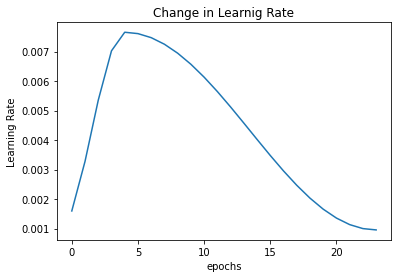

==================== RESULTS ====================
Best Test Accuracy:  95.794
Best Train Accuracy:  89.2


In [7]:
scheduler = {'name': 'OneCycleLR', 'epochs': 24, 'steps': len(train_loader),
             'pct_start': 5/24, 'div_factor': 8, 'final_div_factor': 1, 'anneal_strategy': 'cos'}
sara.fit(train_loader, test_loader, epochs=24, scheduler= scheduler, weight_decay= 1e-2, plot_lr= True)

#max_lr = sara.best_lr (found using range test)
#initial_lr = max_lr/5 
#min_lr = initial_lr/1.5

Best Model Loaded!


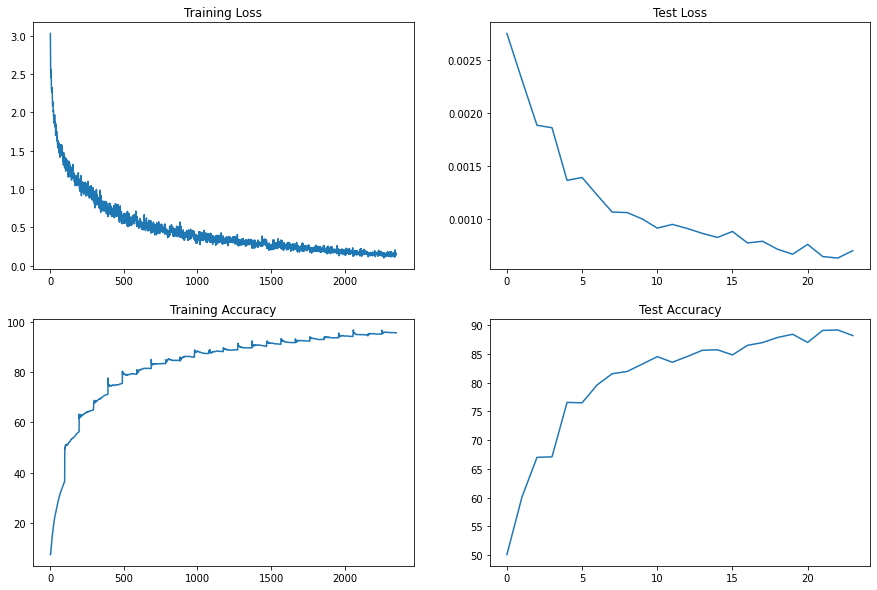

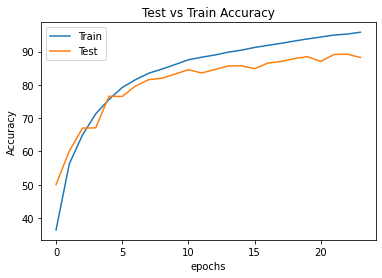

Accuracy of plane : 92 %
Accuracy of   car : 96 %
Accuracy of  bird : 86 %
Accuracy of   cat : 78 %
Accuracy of  deer : 90 %
Accuracy of   dog : 77 %
Accuracy of  frog : 94 %
Accuracy of horse : 94 %
Accuracy of  ship : 91 %
Accuracy of truck : 89 %


In [8]:
sara.plot_graphs(test_loader)


Test set: Average loss: -7.8229, Accuracy: 8920/10000 (89.20%)

torch.Size([1080, 3, 32, 32])


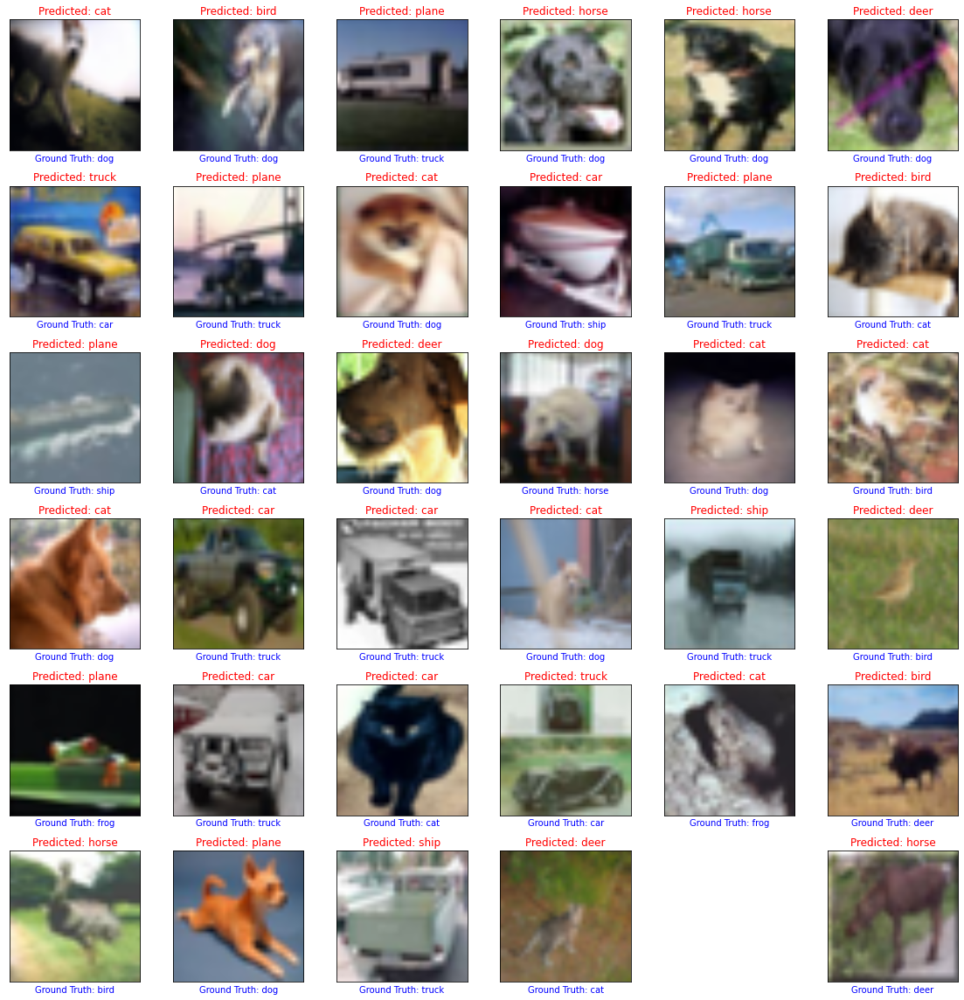

**********Grad-CAM of Mis Classified Images with respect to Predicted(wrong) Class**********


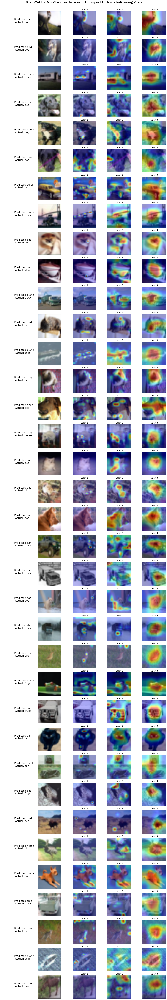

**********Grad-CAM of Mis Classified Images with respect to Actual(correct) Class**********


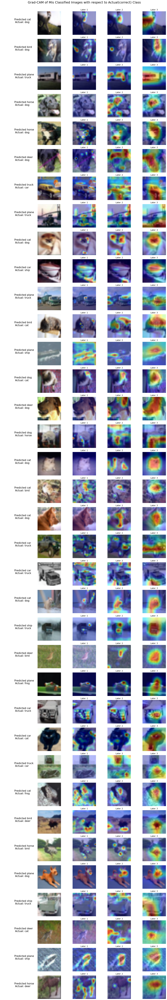

In [9]:
sara.missed_images(test_loader, layers=['layer1', 'layer2', 'layer3'])

In [0]:
from pynoob.plotting.plot import plot_cycle

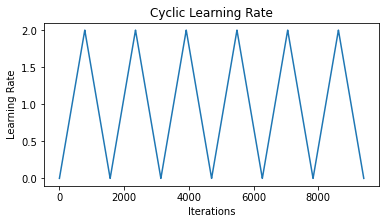

In [11]:
plot_cycle(6, train_loader, max_lr= 2)

In [0]:
'''Code for reference'''
def plot_cycle(no_cycle, loader, step_size=None, min_lr= 0.0001, max_lr = 10):

  if step_size is None:
    step_size = 8*len(loader)

  total_iter = no_cycle*(2*step_size)

  lr_list = [min_lr]

  for i in range(1, total_iter+1):
    cycle = floor(1 + i/(2*step_size))
    x = abs((i/step_size) - (2*cycle) + 1)
    curr_lr = min_lr + (max_lr - min_lr)*(1-x)
    lr_list.append(curr_lr)

  plt.figure(figsize= (no_cycle, 3))
  plt.plot(lr_list)
  plt.title('Cyclic Learning Rate')
  plt.xlabel('Iterations')
  plt.ylabel('Learning Rate')